<a href="https://colab.research.google.com/github/AhmadAlabrash/Ro-Deep-Learning/blob/main/RO_DL_TensorHub_Frezzed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import numpy as np
import PIL
import cv2
import pathlib
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow_hub as hub

In [2]:
url ='https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz'
dir = tf.keras.utils.get_file( origin=url ,cache_dir='.' ,untar=True)

In [3]:
dir =pathlib.Path('/content/datasets/flower_photos')

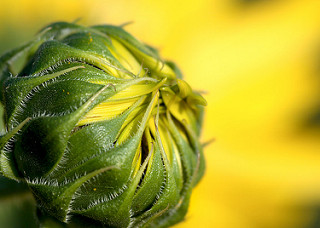

In [4]:
img= PIL.Image.open(list(dir.glob('sunflowers/*.jpg'))[555])
img

In [5]:
flower_images ={
    'sunflowers':list(dir.glob('sunflowers/*.jpg')) ,
    'dandelion':list(dir.glob('dandelion/*.jpg')) ,
    'daisy':list(dir.glob('daisy/*.jpg')) ,
    'roses': list(dir.glob('roses/*.jpg')),
    'tulips': list(dir.glob('tulips/*.jpg'))
}

flower_labels ={
    'sunflowers':0 ,
    'dandelion':1 ,
    'daisy':2 ,
    'roses':3,
    'tulips': 4
}

flower_labels_names =['sunflowers','dandelion','daisy','roses','tulips']

image_shape=(180,180,)

In [6]:
flower_labels_names =['sunflowers','dandelion','daisy','roses','tulips']
image_shape=(224, 224)

In [7]:
x =[]
y =[]

for i,n in flower_images.items() :
  for image in n:
  
    img = cv2.imread(str(image))
    resized_img = cv2.resize(img,image_shape)
  
    x.append(resized_img)
    y.append(flower_labels[i]) 

In [8]:
x = np.array(x)
y = np.array(y)

x = x/255

In [9]:
model = tf.keras.applications.mobilenet_v2.MobileNetV2(
    input_shape=None,
    alpha=1.0,
    include_top=True,
    weights='imagenet',
    input_tensor=None,
    pooling=None,
    classes=1000,
    classifier_activation='softmax',
    
)

In [10]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y,train_size=0.8, random_state=0)

In [11]:
y_pr =model.predict(X_test)


23/23 [==============================] - 24s 994ms/step


In [106]:
y_na =tf.keras.applications.mobilenet_v2.decode_predictions(
    y_pr, top=200
)
y_na = np.array(y_na)
y_na[16][0][1]

'daisy'

In [108]:
def showimg(i):
  plt.matshow(X_test[i])
  plt.xlabel(y_na[i][0][1])




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


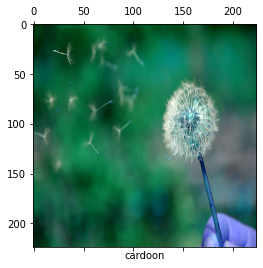

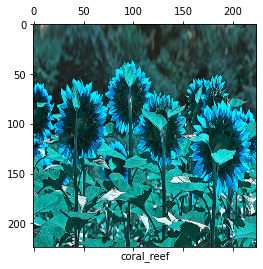

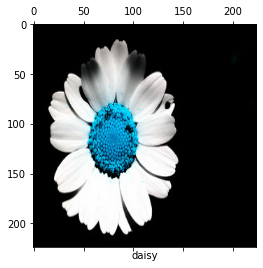

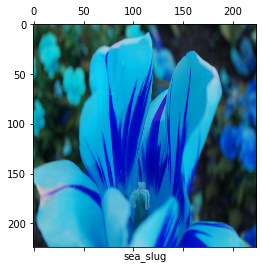

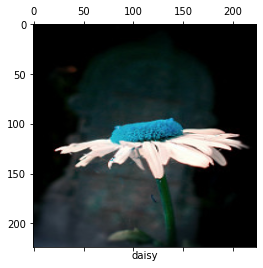

...

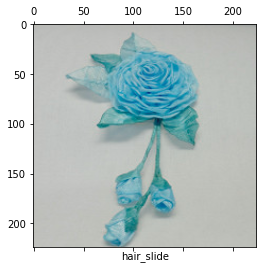

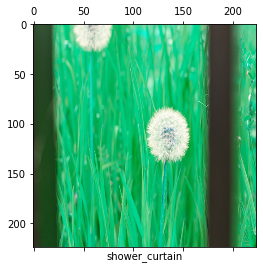

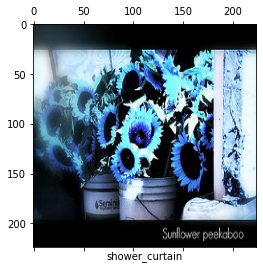

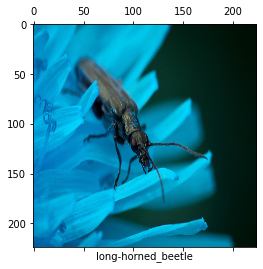

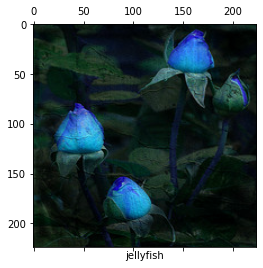

In [109]:
for i in range(100):
    showimg(i)